In [1]:
from cnmf import cNMF
import numpy as np
import pandas as pd
import os
import scanpy as sc
import re

import matplotlib.pyplot as plt

import seaborn

from scipy.stats import ttest_ind,ttest_rel  # for t-test

# Assemble cNMF data
Following tutorial from: https://github.com/dylkot/cNMF

Use the bash script instead for submitting jobs to LSF. Specifically, cnma prepare and cnmf factorize needs to be run with 2_runcNMF.sh, matching the results folders.

In [2]:
# Specify cNMF output folder
cnmf_obj = cNMF(output_dir="./results", name="martin_cNMF")

In [3]:
# Combine results across k values tested
cnmf_obj.combine()

Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.
Combining factorizations for k=8.
Combining factorizations for k=9.
Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.
Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.
Combining factorizations for k=18.
Combining factorizations for k=19.
Combining factorizations for k=20.
Combining factorizations for k=21.
Combining factorizations for k=22.
Combining factorizations for k=23.
Combining factorizations for k=24.
Combining factorizations for k=25.


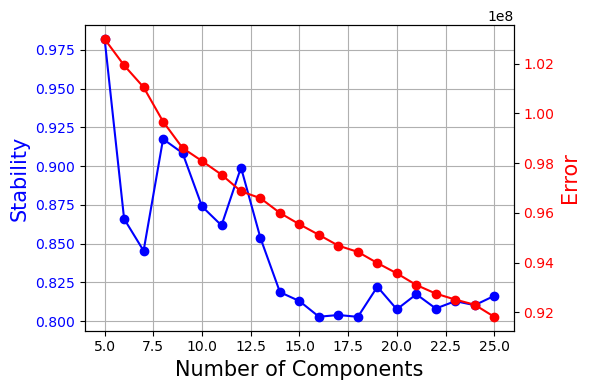

In [4]:
# Plot stability-error tradeoff to help assess number of components k
cnmf_obj.k_selection_plot(close_fig=False)

## Determine number of components, k

In [5]:
# select optimal k
#k = 21
k = 19 

/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/cnmf/cnmf.py:772: RuntimeWarning: invalid value encountered in divide
  norm_tpm = (np.array(tpm.X.todense()) - tpm_stats['__mean'].values) / tpm_stats['__std'].values
/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


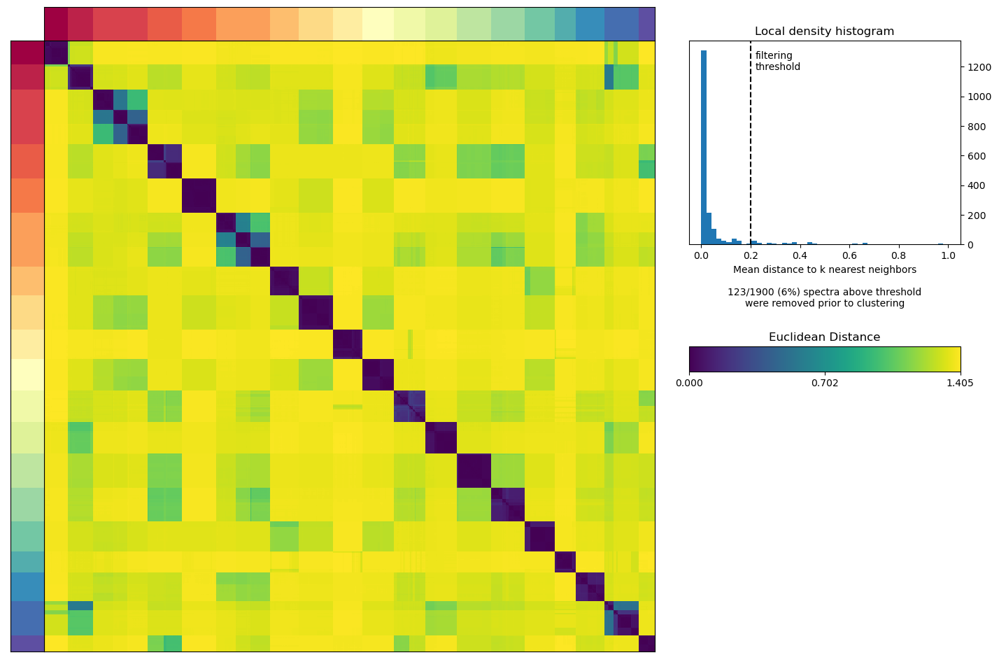

In [6]:
# Plot consistency of cNMF components by clustering consensus estimates for gene programs
cnmf_obj.consensus(k=k, density_threshold=0.2)

In [7]:
# Extract data for given k
usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(K=k, density_threshold=0.2)

In [8]:
#usage

In [9]:
#spectra_scores

In [10]:
# pd.set_option('display.max_rows', 50)
# top_genes

In [11]:
spectra_scores

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
ENSG00000243485,-0.000029,0.000097,-0.000050,-0.000011,-0.000006,-0.000020,-0.000011,-0.000006,-0.000005,-3.487631e-06,-0.000006,-0.000003,-0.000005,-0.000005,-0.000005,-0.000009,0.000010,-0.000002,-0.000005
ENSG00000237613,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000186092,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000238009,0.000008,-0.000073,0.000008,0.000008,0.000009,-0.000164,-0.000033,0.000006,-0.000027,1.749116e-08,0.000218,0.000006,-0.000014,-0.000083,-0.000029,0.000884,-0.000057,-0.000052,-0.000028
ENSG00000239945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000277856,-0.000168,0.000490,-0.000172,-0.000002,-0.000036,-0.000167,-0.000041,0.000026,-0.000038,-3.672042e-05,-0.000048,0.000012,-0.000031,0.000043,-0.000053,-0.000048,-0.000078,-0.000037,-0.000032
ENSG00000275063,-0.000265,0.000797,-0.000310,0.000071,-0.000072,-0.000123,-0.000057,-0.000009,-0.000045,-3.553248e-05,-0.000050,0.000064,-0.000041,-0.000035,-0.000072,-0.000090,-0.000113,-0.000050,-0.000051
ENSG00000271254,-0.000074,-0.000194,-0.000125,-0.000088,0.000069,-0.000074,-0.000016,-0.000126,0.000053,9.732869e-05,0.000621,0.000025,0.000259,0.000073,0.000014,0.000311,0.000984,-0.000050,-0.000005
ENSG00000277475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Joint analysis of cNMF usage matrix with anndata object

In [12]:
# Load raw data, containing cell barcode index
adata_raw = sc.read('../data/external/martin19_raw/martin19_all.raw.annot.h5ad')

# Load anndata object, used for plotting UMAP and cell type annotations
adata = sc.read_h5ad("/nfs/team205/re5/data/martin19_all.processed.cellxgene_for_rasa.h5ad")

Only considering the two last: ['.annot', '.h5ad'].
Only considering the two last: ['.annot', '.h5ad'].


In [13]:
adata_raw.var

,gene_ids,gene_symbol
gene_ids,,
ENSG00000243485,ENSG00000243485,RP11-34P13.3
ENSG00000237613,ENSG00000237613,FAM138A
ENSG00000186092,ENSG00000186092,OR4F5
ENSG00000238009,ENSG00000238009,RP11-34P13.7
ENSG00000239945,ENSG00000239945,RP11-34P13.8
...,...,...
ENSG00000277856,ENSG00000277856,AC233755.2
ENSG00000275063,ENSG00000275063,AC233755.1
ENSG00000271254,ENSG00000271254,AC240274.1


In [14]:
adata_raw.var.index

Index(['ENSG00000243485', 'ENSG00000237613', 'ENSG00000186092',
       'ENSG00000238009', 'ENSG00000239945', 'ENSG00000239906',
       'ENSG00000241599', 'ENSG00000279928', 'ENSG00000279457',
       'ENSG00000228463',
       ...
       'ENSG00000277196', 'ENSG00000277630', 'ENSG00000278384',
       'ENSG00000278633', 'ENSG00000276345', 'ENSG00000277856',
       'ENSG00000275063', 'ENSG00000271254', 'ENSG00000277475',
       'ENSG00000268674'],
      dtype='object', name='gene_ids', length=33694)

In [15]:
# Replace ensembl with gene symbols
top_genes_symbol = top_genes.replace(adata_raw.var.index, adata_raw.var.gene_symbol)

In [16]:
# Write top-100 genes to table
top_genes_symbol.to_csv("results/cNMF_martin_k" + str(k) + "_top_genes.csv", index=False)

In [17]:
spectra_scores_symbol = spectra_scores.copy()
spectra_scores_symbol.index = spectra_scores.index.map(adata_raw.var.gene_symbol)

In [18]:
spectra_scores_symbol.to_csv("results/cNMF_martin_k" + str(k) + "_spectra.csv")

## Format cNMF usage rows and columns

In [19]:
#usage.index

In [20]:
# Rename usage columns prepending 'cNMF_'
usage.columns = ["cNMF_" + str(x) for x in usage.columns]

# convert from relative cell index to cell barcode
#usage.index = adata_raw.obs.index[usage.index]

usage

,cNMF_1,cNMF_2,cNMF_3,cNMF_4,cNMF_5,cNMF_6,cNMF_7,cNMF_8,cNMF_9,cNMF_10,cNMF_11,cNMF_12,cNMF_13,cNMF_14,cNMF_15,cNMF_16,cNMF_17,cNMF_18,cNMF_19
AAACATACACACCA-1-69,0.470996,0.003271,0.000000,0.401020,0.012053,0.000000,0.000000,0.055133,0.011644,0.000000,0.000000,0.012557,0.013228,0.000000,0.006900,0.000000,0.013196,0.000000,0.000000
AAACATTGGTGTCA-1-69,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120619,0.000688,0.000000,0.020157,0.107735,0.737779,0.000000,0.000000,0.000000,0.008124,0.000000,0.000000,0.004898
AAACGCACTTAGGC-1-69,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006441,0.924445,0.031841,0.020381,0.000000,0.000000,0.000000,0.016892,0.000000
AAACGCTGCTACCC-1-69,0.305135,0.000000,0.000000,0.682781,0.000000,0.000000,0.000000,0.000000,0.005269,0.000000,0.000000,0.006815,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AAACGCTGTCCAGA-1-69,0.000000,0.099567,0.613249,0.144102,0.105103,0.006918,0.000000,0.011536,0.008565,0.000000,0.000000,0.008111,0.000000,0.000000,0.000000,0.000000,0.002850,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCTACTTAACCG-1-68,0.000000,0.937289,0.019439,0.016591,0.000000,0.000000,0.000000,0.002444,0.001427,0.001244,0.000000,0.016829,0.000000,0.000000,0.004737,0.000000,0.000000,0.000000,0.000000
TTTGACTGCCTTGC-1-68,0.000000,0.890920,0.014116,0.048164,0.011158,0.016475,0.000000,0.005580,0.000244,0.002040,0.000000,0.008524,0.000770,0.000000,0.000470,0.000292,0.001247,0.000000,0.000000
TTTGCATGAGATCC-1-68,0.000000,0.829018,0.101135,0.032871,0.020748,0.006062,0.000000,0.000801,0.000541,0.000000,0.000000,0.005931,0.002206,0.000000,0.000000,0.000000,0.000658,0.000031,0.000000
TTTGCATGAGTTCG-1-68,0.000000,0.954765,0.017683,0.016572,0.003427,0.000000,0.000000,0.005617,0.000468,0.000771,0.000000,0.000666,0.000030,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [21]:
# Strip last '-nonL' and '-L' from cell barcodes
new_index = [re.search("^(.+)-.+$", x).group(1) for x in adata.obs.index]
adata.obs.index = new_index

In [22]:
# left join cNMF usage per cell
adata.obs = adata.obs.join(usage)

## Plots

/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


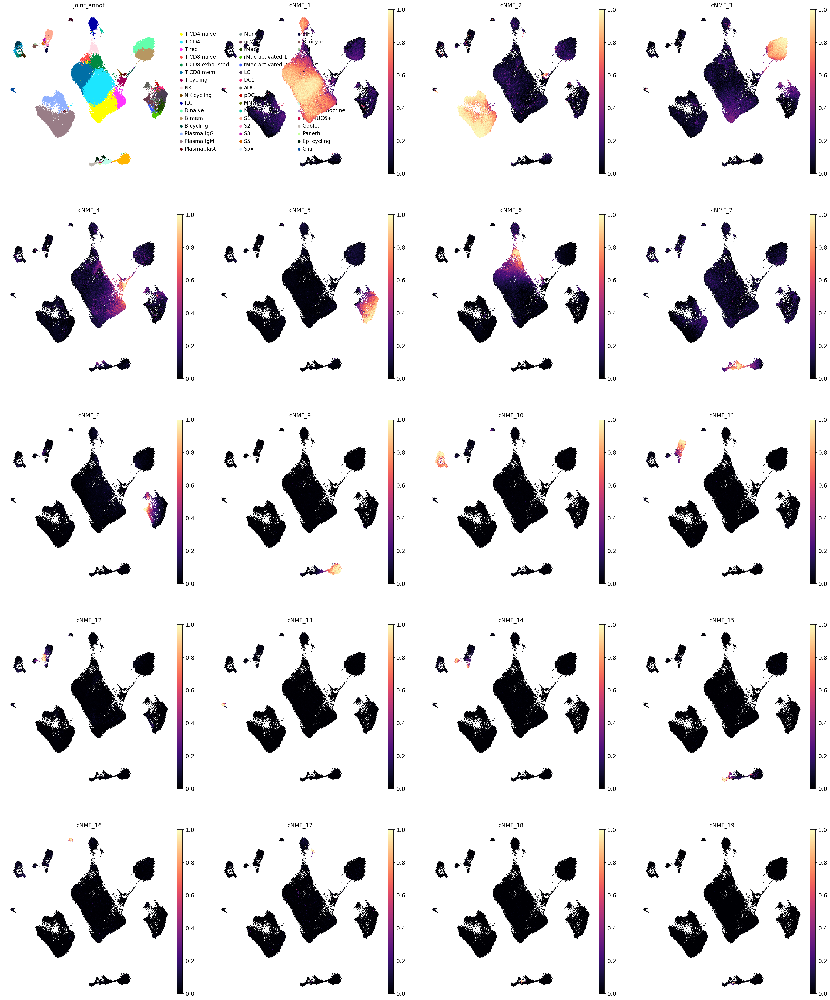

In [23]:
# UMAP plots colored by cNMF usage
sc.set_figure_params(dpi_save=150, figsize=(8, 8))

# without outline
sc.pl.umap(
    adata,
    color=['joint_annot'] + usage.columns.to_list(),
    #palette='tab10',
    cmap='magma',
    frameon=False,
    vmax=1.0,
    vmin=0.0,
    size=15,  # point size
    save='_martin19_cNMF_usage.pdf'  # in ./figures
)

         Falling back to preprocessing with `sc.pp.pca` and default params.


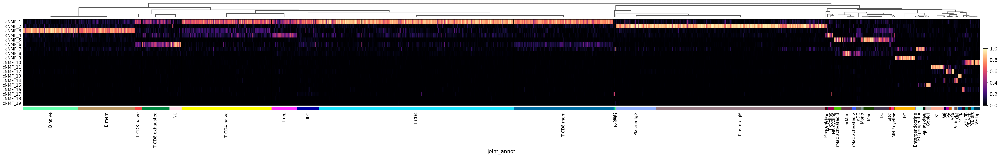

In [24]:
# Heatmap of cNMF usage by cell type
sc.set_figure_params(dpi_save=300)
sc.tl.dendrogram(adata, groupby='joint_annot')
sc.pl.heatmap(
    adata,
    var_names=usage.columns,
    groupby='joint_annot',
    dendrogram=True,
    swap_axes=True,
    cmap="magma",
    figsize=(48, 5.5),
    save="_martin19_cNMF_usage.pdf"
)

In [25]:
from matplotlib import rcParams

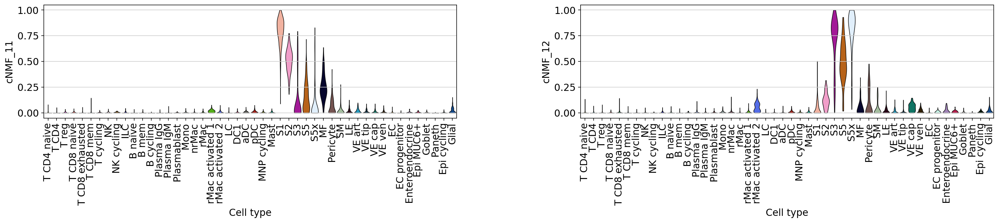

In [26]:
#sc.set_figure_params(dpi_save=300)
rcParams['figure.figsize'] = 9,3
sc.pl.violin(
    adata,
    keys=['cNMF_11', 'cNMF_12'],
    groupby='joint_annot',
    xlabel='Cell type',
    rotation=90,
    linewidth=0.75,
    stripplot=False,
    save="_martin19_fibroblast_factors.pdf"
)

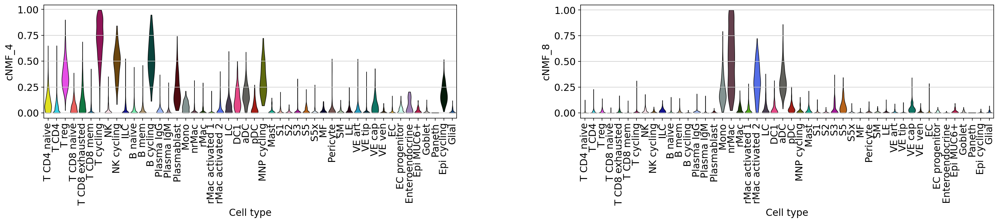

In [27]:
#sc.set_figure_params(dpi_save=300)
rcParams['figure.figsize'] = 9,3
sc.pl.violin(
    adata,
    keys=['cNMF_4', 'cNMF_8'],
    groupby='joint_annot',
    xlabel='Cell type',
    rotation=90,
    linewidth=0.75,
    stripplot=False,
    save="_martin19_fibroblast_factors_4_8.pdf"
)

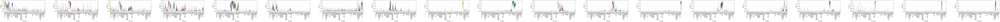

In [30]:
# All violin plots to pdf file
rcParams['figure.figsize'] = 9,3
sc.pl.violin(
    adata,
    keys=[f'cNMF_{i}' for i in range(1, k + 1)],
    groupby='joint_annot',
    xlabel='Cell type',
    rotation=90,
    linewidth=0.75,
    stripplot=False,
    multi_panel = True,
    save="_martin19_fibroblast_factors_all.pdf"
)

# Test association of cNMF factors in MUC6+ cells

In [23]:
d = adata.obs[adata.obs.joint_annot == 'Epi MUC6+'][['cNMF_11', 'cNMF_12', 'joint_annot']]

d = d.melt(id_vars='joint_annot', var_name='factor', value_name='activity')

In [24]:
#d

In [25]:
# Two-sided t-test
ttest_ind(d.activity[d.factor == 'cNMF_11'], d.activity[d.factor == 'cNMF_12'])

Ttest_indResult(statistic=-2.1263035489086124, pvalue=0.03843769467084029)

In [26]:
# Paired t-test
ttest_rel(d.activity[d.factor == 'cNMF_11'], d.activity[d.factor == 'cNMF_12'])

TtestResult(statistic=-1.9799521904245327, pvalue=0.05881762830044376, df=25)

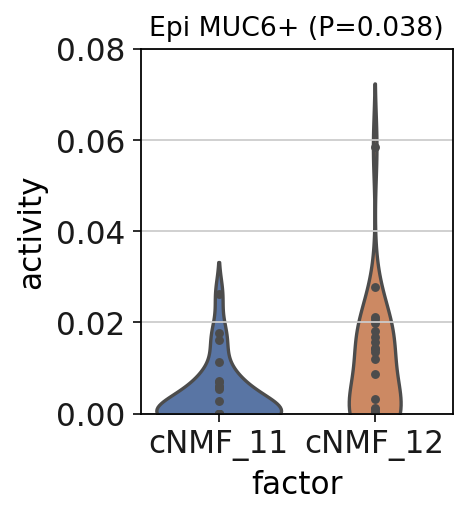

In [27]:

rcParams['figure.figsize'] = 2.5,3
plt.ylim(0, 0.08)

seaborn.set(style='whitegrid')
seaborn.violinplot(d, x="factor", y="activity", inner="point").set_title("Epi MUC6+ (P=0.038)")  # P-value from above t-test
#seaborn.stripplot(d, x="variable", y="activity")
#seaborn.despine()  # remove outline

plt.savefig("figures/martin19_MUC6_cNMF.pdf", bbox_inches='tight')

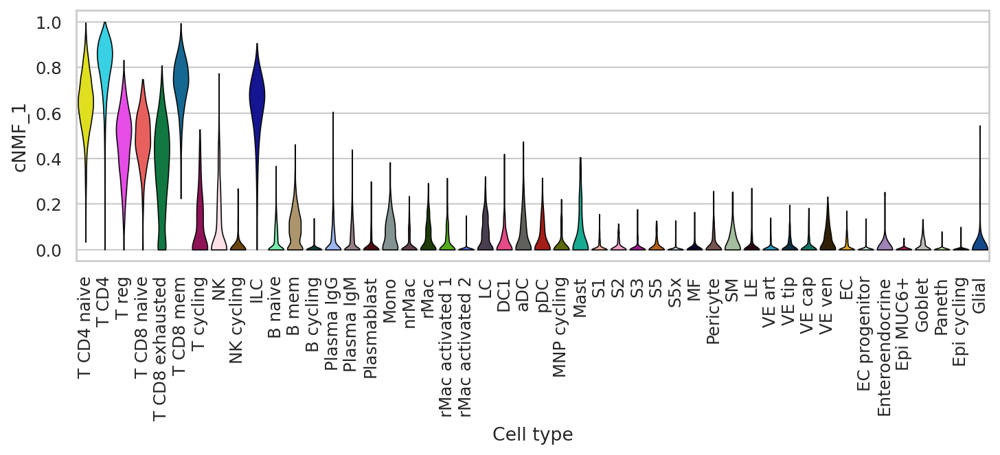

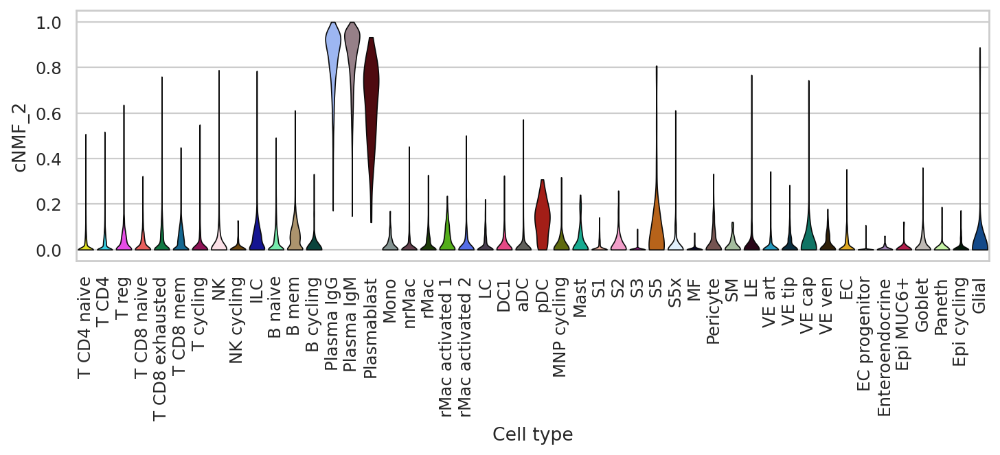

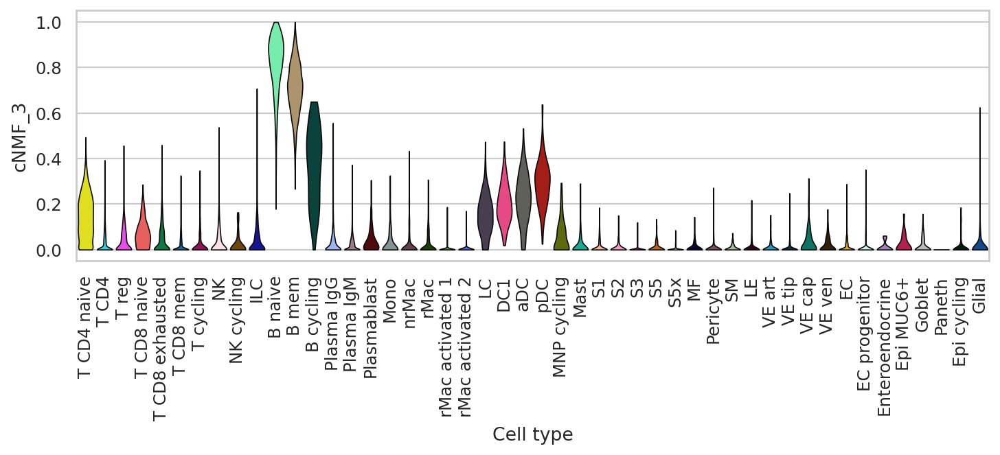

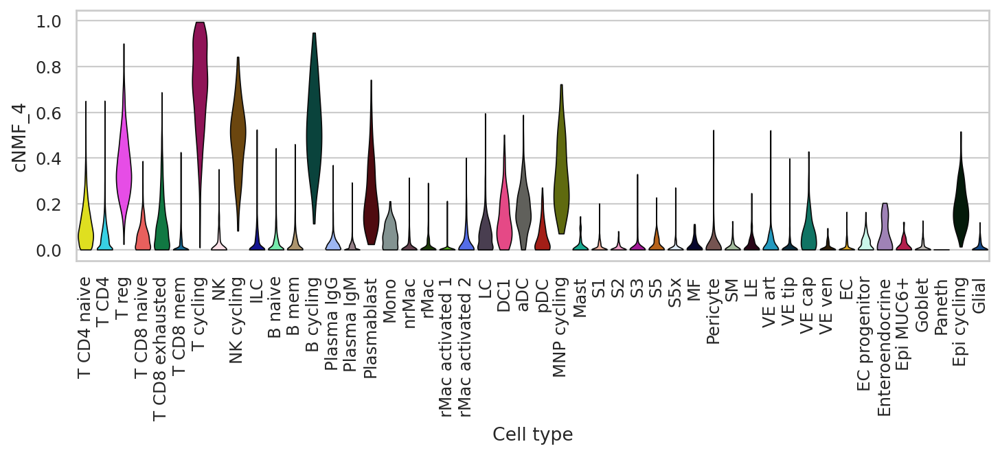

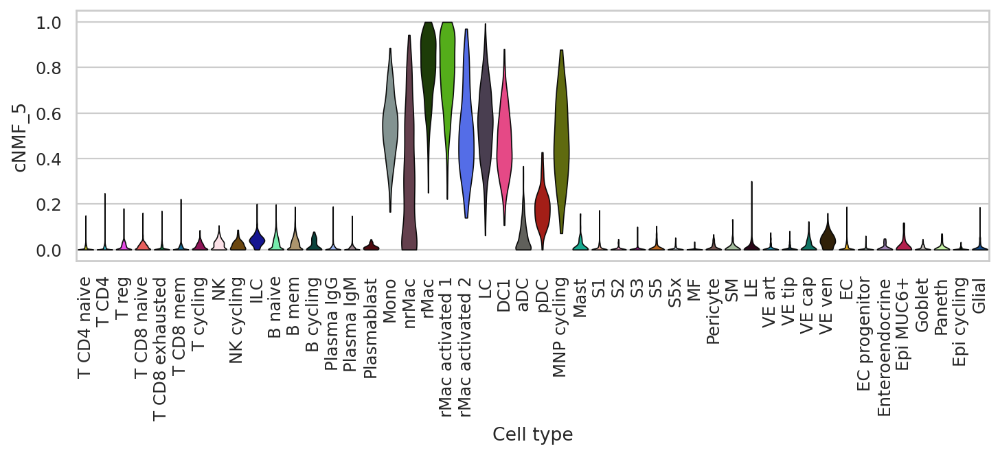

...

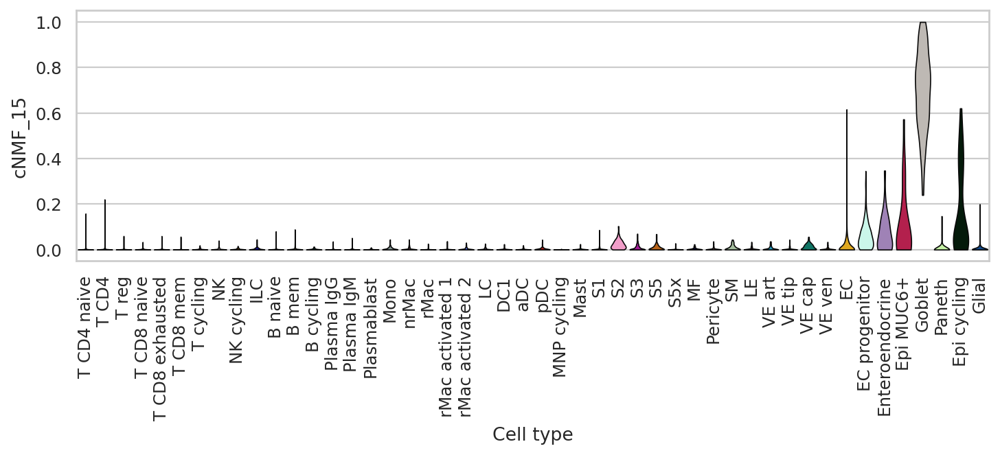

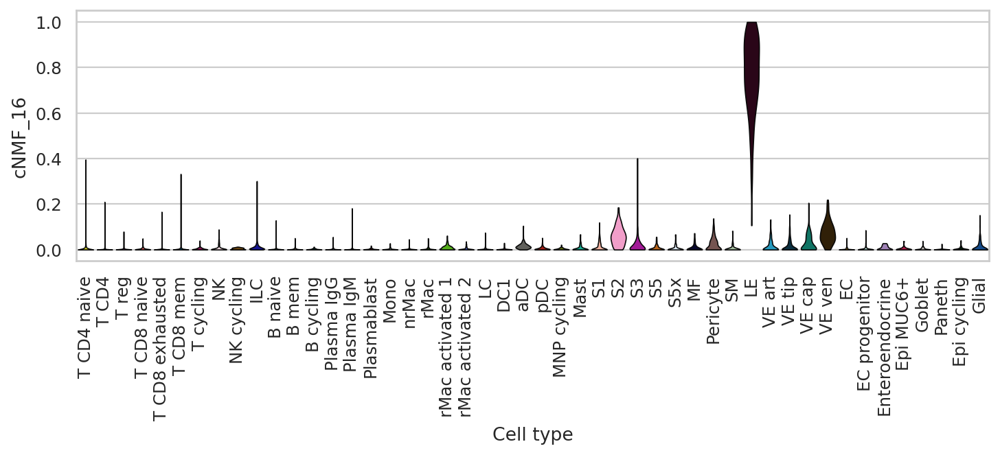

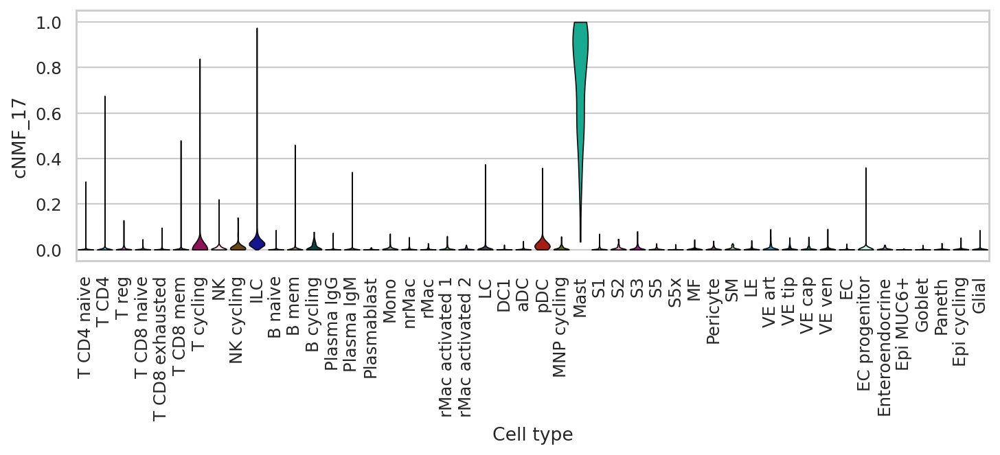

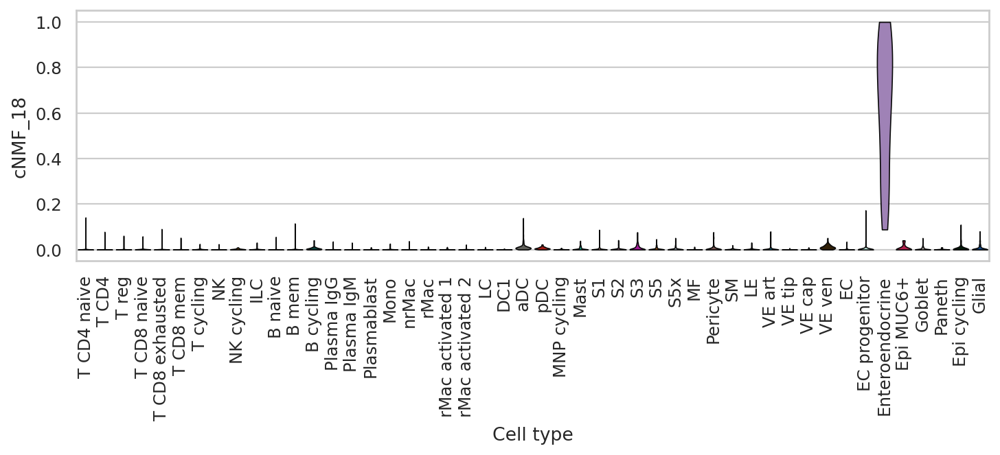

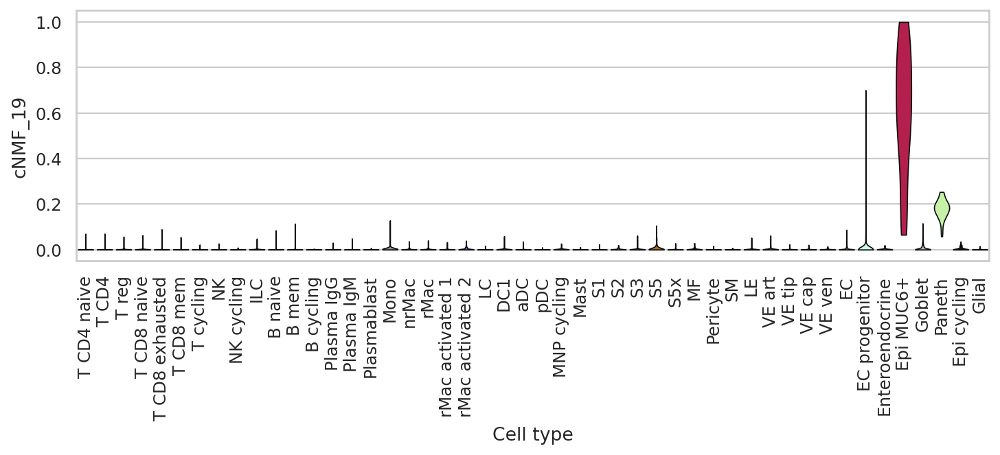

In [28]:
# Plot cell type violin plots for all cNMF factors
for i in range(1, 20):
    rcParams['figure.figsize'] = 9,3
    seaborn.set(style='whitegrid')
    sc.pl.violin(
        adata,
        keys=['cNMF_' + str(i)],
        groupby='joint_annot',
        xlabel='Cell type',
        rotation=90,
        linewidth=0.75,
        stripplot=False,
    )